<a href="https://colab.research.google.com/github/miguel-fc/PyTorch-tools/blob/main/neutron_reflectivity_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# Import required packages
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
%matplotlib inline
import gdown
from skimage.measure import label, regionprops, regionprops_table
from scipy.stats import gaussian_kde
import torch
from sklearn.model_selection import train_test_split

In [2]:
!gdown "https://drive.google.com/uc?id=1Q9PX_3XUpYpYNtSMjNa0VD50qJQaujLl"

Downloading...
From: https://drive.google.com/uc?id=1Q9PX_3XUpYpYNtSMjNa0VD50qJQaujLl
To: /content/all_sld_data_fp34.tar.gz
100% 2.14M/2.14M [00:00<00:00, 165MB/s]


In [3]:
!gunzip /content/all_sld_data_fp34.tar.gz

In [4]:
!tar -xvf /content/all_sld_data_fp34.tar

Streaming output truncated to the last 5000 lines.
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_3324.dat
all_sld_data_fp34/random_initial_guess/._params_956.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_956.dat
all_sld_data_fp34/random_initial_guess/._params_1533.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_1533.dat
all_sld_data_fp34/random_initial_guess/._params_7142.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_7142.dat
all_sld_data_fp34/random_initial_guess/._params_8271.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_8271.dat
all_sld_data_fp34/random_initial_

In [5]:
!cd /content/all_sld_data_fp34/random_initial_guess/

In [6]:
!rm ._*

In [7]:
def read_sld_files(file_name):
    print(file_name)
    with open(file_name, 'r') as data:
        x = []
        y = []
        xy = [x,y]
        for line in data:
            p = line.split()
            # print(p)
            x.append(float(p[0]))
            y.append(float(p[1]))
            xy = x,y
            # array_xy = np.asarray(xy)

    return np.asarray(x),np.asarray(y)


def read_params_files(file_name):
    print(file_name)
    with open(file_name, 'r') as data:
        x = []
        # y = []
        for line in data:
            # print(line)
            p = line.split()
            # print(p)
            x.append(p[3])

    return x

In [8]:
folder = '/content/all_sld_data_fp34/random_initial_guess/'

datafiles = [os.path.join(root, filename)
          for root, dirs, files in os.walk(folder)
          for filename in files
          if filename.lower().startswith('sld')]

total_sld_datafiles = []

for file in datafiles:
  dataindiv = read_sld_files(file)
  total_sld_datafiles.append(dataindiv)


folder = '/content/all_sld_data_fp34/random_initial_guess/'

datafiles = [os.path.join(root, filename)
          for root, dirs, files in os.walk(folder)
          for filename in files
          if filename.lower().startswith('p')]


total_params_datafiles = []

for file in datafiles:
  dataindiv = read_params_files(file)
  total_params_datafiles.append(dataindiv)

Streaming output truncated to the last 5000 lines.
/content/all_sld_data_fp34/random_initial_guess/params_6664.dat
/content/all_sld_data_fp34/random_initial_guess/params_3085.dat
/content/all_sld_data_fp34/random_initial_guess/params_4184.dat
/content/all_sld_data_fp34/random_initial_guess/params_7227.dat
/content/all_sld_data_fp34/random_initial_guess/params_6729.dat
/content/all_sld_data_fp34/random_initial_guess/params_7929.dat
/content/all_sld_data_fp34/random_initial_guess/params_9625.dat
/content/all_sld_data_fp34/random_initial_guess/params_4056.dat
/content/all_sld_data_fp34/random_initial_guess/params_2469.dat
/content/all_sld_data_fp34/random_initial_guess/params_6598.dat
/content/all_sld_data_fp34/random_initial_guess/params_7327.dat
/content/all_sld_data_fp34/random_initial_guess/params_1997.dat
/content/all_sld_data_fp34/random_initial_guess/params_9136.dat
/content/all_sld_data_fp34/random_initial_guess/params_9329.dat
/content/all_sld_data_fp34/random_initial_guess/param

In [9]:
len(total_params_datafiles), len(total_sld_datafiles)

(9056, 875)

In [10]:
sld_arr = np.asarray(total_sld_datafiles)
sld_arr.shape

(875, 2, 128)

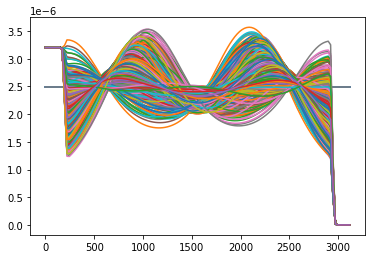

In [11]:
for x in range(875):
  plt.plot(sld_arr[x][0], sld_arr[x][1])
plt.show()

In [12]:
x_val=sld_arr[:,0,:]
x_min = x_val.min()
x_max = x_val.max()
print('x-range = ', x_min, ' to ',x_max)
y_val=sld_arr[:,1,:]
y_min = y_val.min()
y_max = y_val.max()
print('y-range = ', y_min, ' to ',y_max)

x-range =  0.0  to  3119.78
y-range =  8.28593e-16  to  3.56855e-06


In [13]:
#Normalize
sld_arr[:,0,:] = (sld_arr[:,0,:] - x_min)/(x_max - x_min)
sld_arr[:,1,:] = (sld_arr[:,1,:] - y_min)/(y_max - y_min)

In [14]:
sld_arr.max(), sld_arr.min()

(1.0, 0.0)

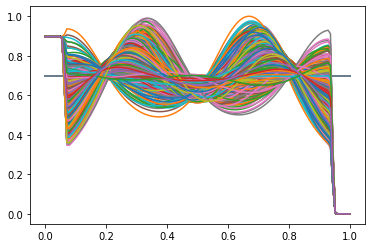

In [15]:
for x in range(875):
  plt.plot(sld_arr[x][0], sld_arr[x][1])
plt.show()

In [16]:
sld_arr.max(), sld_arr.min()

(1.0, 0.0)

In [17]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split, Dataset
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

In [18]:
np.random.shuffle(sld_arr)

m=len(sld_arr)
# print(m-m*0.2)

ntrain_loader, nval = sld_arr[:int(m-m*0.2),:,:], sld_arr[int(m-m*0.2):,:]
m = len(nval)//2

# print(m1)
nval_loader, ntest_loader = nval[:int(m),:,:], nval[int(m):,:,:]


xtrain_dataset, x_temp = train_test_split(sld_arr, train_size=0.8)
xval_dataset, xtest_dataset = train_test_split(x_temp, test_size=0.5)
print(xtrain_dataset.shape, xval_dataset.shape, xtest_dataset.shape)

batch_size = 50

train_loader = torch.utils.data.DataLoader(torch.tensor(xtrain_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(torch.tensor(xval_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(torch.tensor(xtest_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)

# ytrain_loader = torch.utils.data.DataLoader(torch.tensor(ytrain_dataset).float(), batch_size=batch_size)
# yvalid_loader = torch.utils.data.DataLoader(torch.tensor(yval_dataset).float(), batch_size=batch_size)
# ytest_loader = torch.utils.data.DataLoader(torch.tensor(ytest_dataset).float(), batch_size=batch_size)

(700, 2, 128) (87, 2, 128) (88, 2, 128)


In [19]:
# from google.colab import drive
# drive.mount('/content/gdrive/')

In [20]:
# !cp /content/gdrive/MyDrive/Pytorch-tools-gdrive/neutron_refl_autoencoder.py .

In [21]:
# import neutron_refl_autoencoder as LA

In [22]:
class LAutoencoder(nn.Module):
    
    def __init__(self,encoded_space_dim,dim1,dim2):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Linear(dim1 * dim2, 500),
            nn.ReLU(True),
            nn.Linear(500, 500),
            nn.ReLU(True),
            nn.Linear(500,encoded_space_dim))
        self.decoder = nn.Sequential(
            nn.Linear(encoded_space_dim, 500),
            nn.ReLU(True),
            nn.Linear(500, 500),
            nn.ReLU(True),
            nn.Linear(500, dim1 * dim2))
        
    def forward(self, x):
            latent = self.encoder(x)
            x = self.decoder(latent)
            return x,latent


In [23]:
### Training function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    model.train()
    # decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for data in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        img = data
        img = img.view(img.size(0), -1).to(device)  
        # Encode and Decode data
        output,latent = model(img)
        loss = loss_fn(output, img)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        # print('\t train loss per batch: %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [24]:
### Testing function
def test_epoch(model, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    model.eval()
    # decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for  data in dataloader:
            img = data
            img = img.view(img.size(0), -1).to(device) 
            # Encode and Decode data
            output, latent = model(img)
            # Append the network output and the original image to the lists
            conc_out.append(output.cpu())
            conc_label.append(img.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [25]:
def plot_ae_outputs(model,dataset,device,n=10):
    torch_dataset = torch.tensor(dataset[:,np.newaxis,:,:]).float()
    plt.figure(figsize=(26,5.5))
    # targets = test_dataset.targets.numpy()
    # t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(10):
      ax = plt.subplot(2,n,i+1)
      img = torch_dataset[i]
      # print(img.shape)
      img = img.view(img.size(0), -1).to(device) 
      # print(img.shape)
      model.eval().to(device)
      with torch.no_grad():
         rec_img,_  = model(img)
        #  print("pepe",img.shape,rec_img.shape)
      # plt.plot(img.cpu().reshape(28,28).numpy(), cmap='gist_gray')
      plt.plot(img.cpu().reshape(2,128).numpy()[0],img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      # plt.imshow(rec_img.cpu().reshape(28,28).numpy(), cmap='gist_gray')  
      plt.plot(rec_img.cpu().reshape(2,128).numpy()[0],rec_img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

In [26]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 2
in_d1 = 2
in_d2 = 128

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
model = LAutoencoder(encoded_space_dim=d,dim1=in_d1,dim2=in_d2)
params_to_optimize = [
    {'params': model.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')
# Move both the encoder and the decoder to the selected device
model.to(device)

Selected device: cpu


LAutoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=256, out_features=500, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=500, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=500, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=500, out_features=256, bias=True)
  )
)

EPOCH 1/100 	 train loss 0.11144799739122391 	 val loss 0.01572973094880581


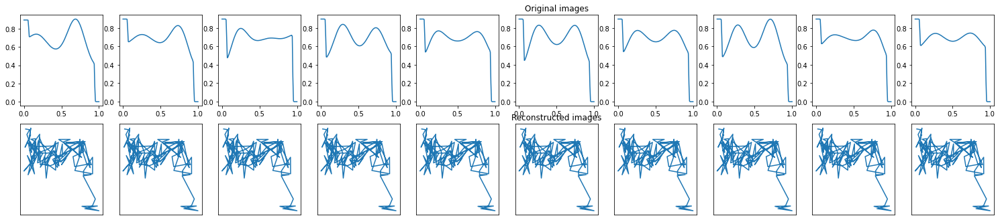

EPOCH 2/100 	 train loss 0.007145716343075037 	 val loss 0.003374628024175763


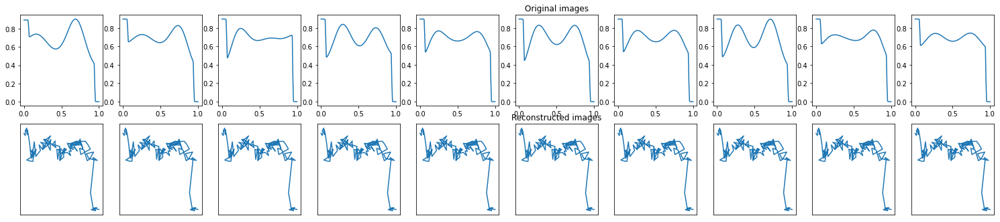

EPOCH 3/100 	 train loss 0.0023378131445497274 	 val loss 0.001602254225872457


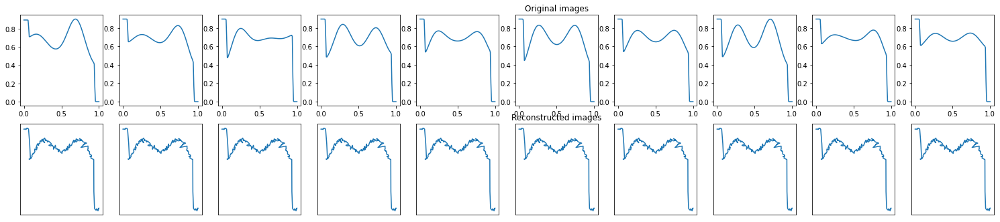

EPOCH 4/100 	 train loss 0.001724885543808341 	 val loss 0.0014647437492385507


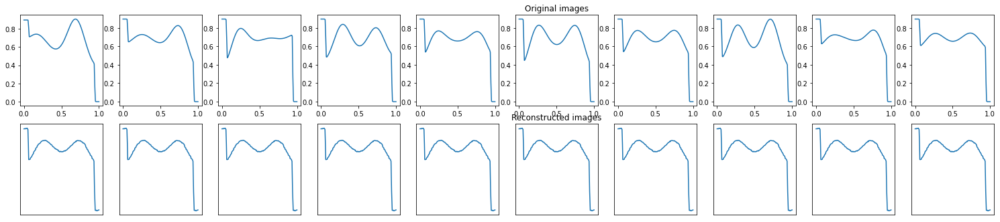

EPOCH 5/100 	 train loss 0.001661163754761219 	 val loss 0.0014537315582856536


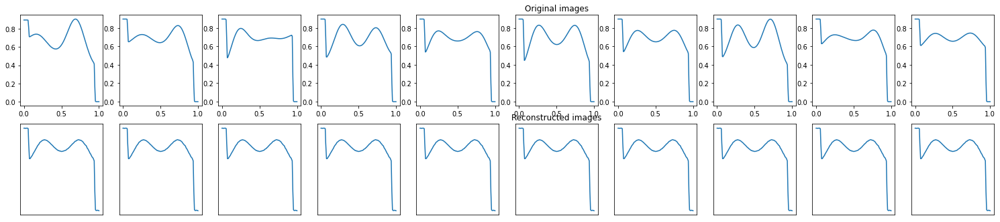

EPOCH 6/100 	 train loss 0.001660614158026874 	 val loss 0.0014562290161848068


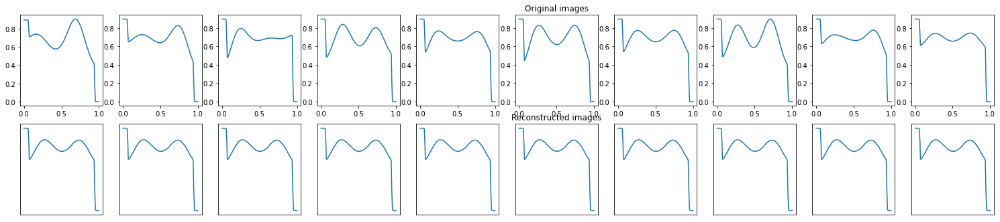

EPOCH 7/100 	 train loss 0.0016602907562628388 	 val loss 0.0014529423788189888


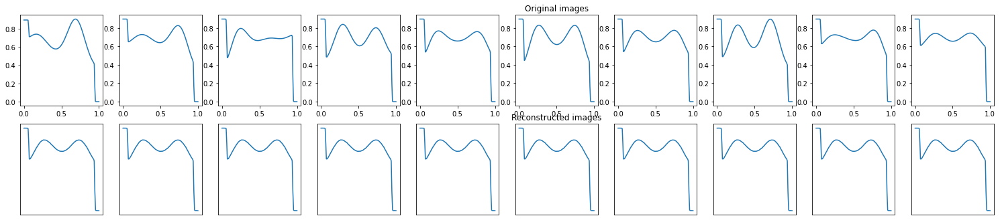

EPOCH 8/100 	 train loss 0.0016613552579656243 	 val loss 0.0014631428057327867


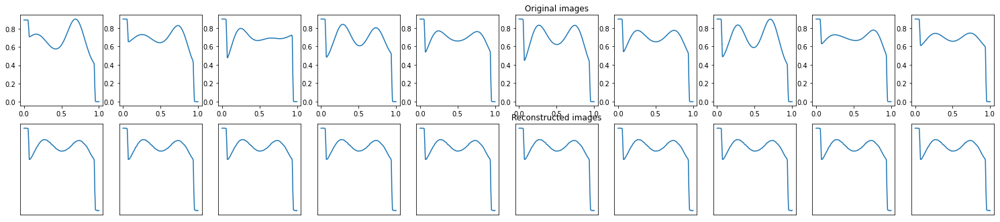

EPOCH 9/100 	 train loss 0.001656607142649591 	 val loss 0.0014606215991079807


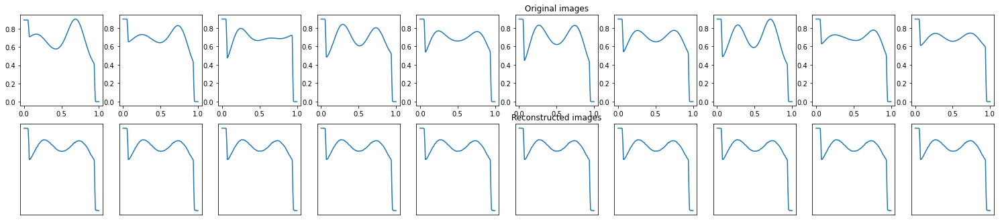

EPOCH 10/100 	 train loss 0.0016521468060091138 	 val loss 0.001448600785806775


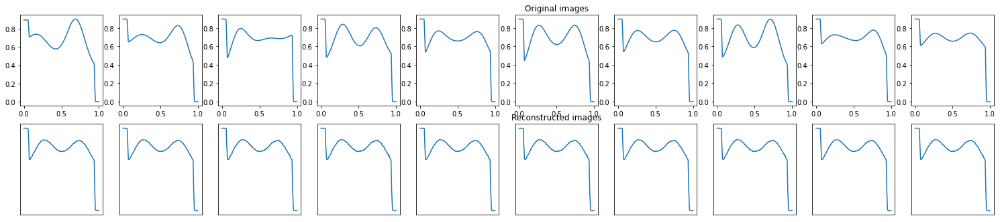

EPOCH 11/100 	 train loss 0.0016287838807329535 	 val loss 0.0013699282426387072


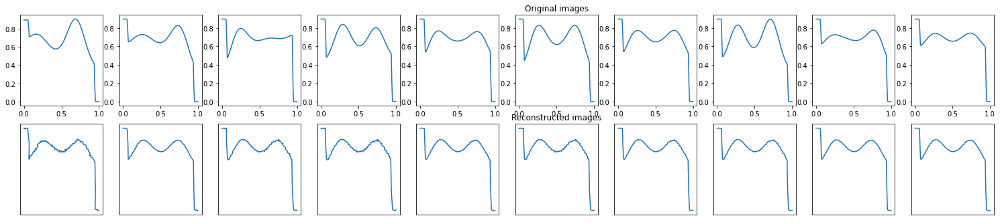

EPOCH 12/100 	 train loss 0.001461550360545516 	 val loss 0.0011756187304854393


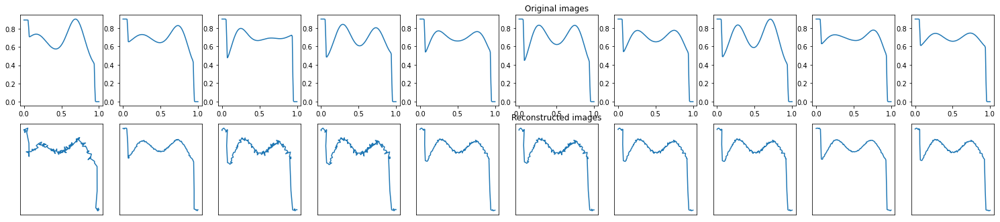

EPOCH 13/100 	 train loss 0.0011152861407026649 	 val loss 0.0007745493203401566


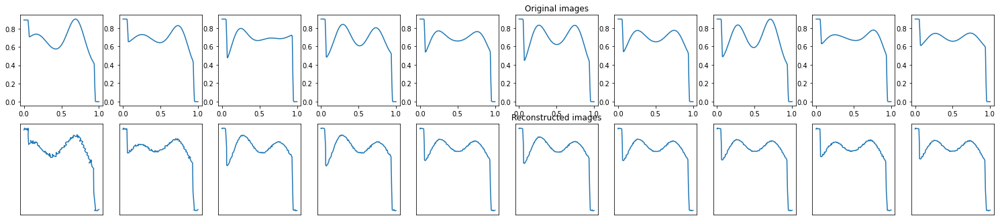

EPOCH 14/100 	 train loss 0.0008923826972022653 	 val loss 0.0007306968327611685


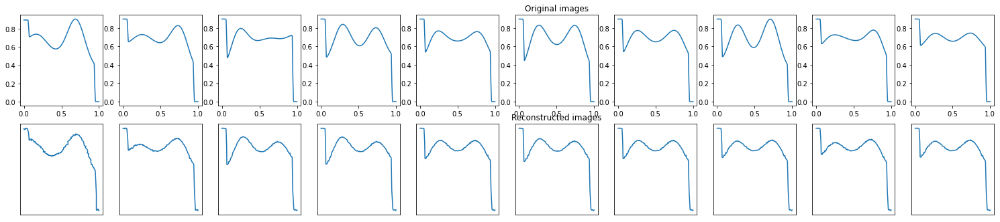

EPOCH 15/100 	 train loss 0.0008198576979339123 	 val loss 0.0007060268544591963


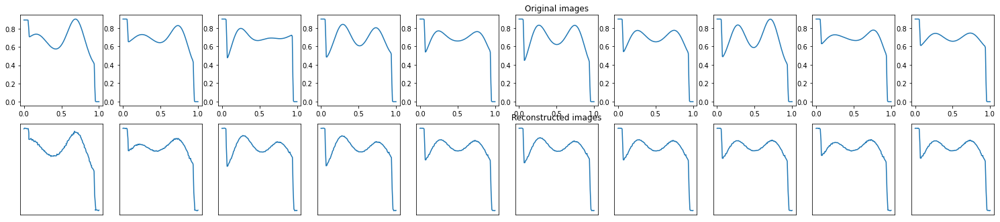

EPOCH 16/100 	 train loss 0.0007971207960508764 	 val loss 0.0006954461568966508


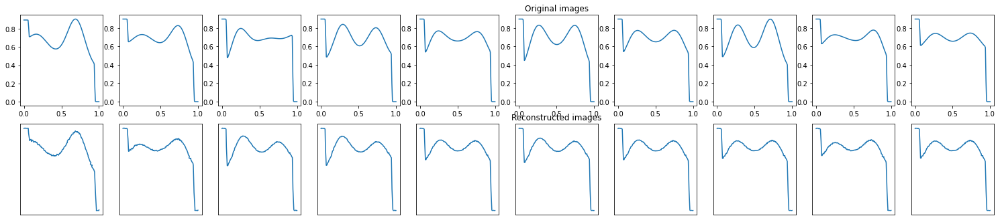

EPOCH 17/100 	 train loss 0.0007893183501437306 	 val loss 0.0007166910218074918


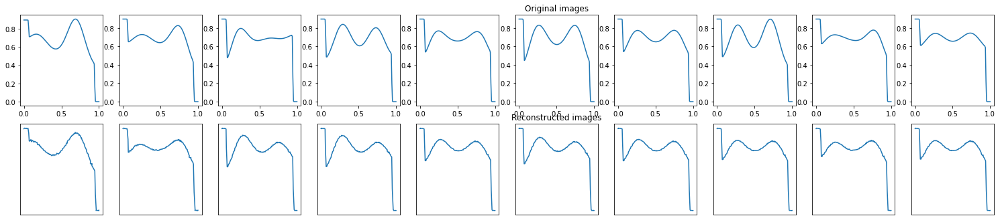

EPOCH 18/100 	 train loss 0.000786648306529969 	 val loss 0.0007180336979217827


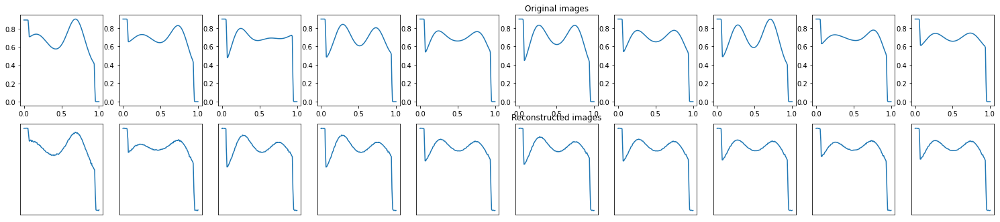

EPOCH 19/100 	 train loss 0.000784144620411098 	 val loss 0.0007285099127329886


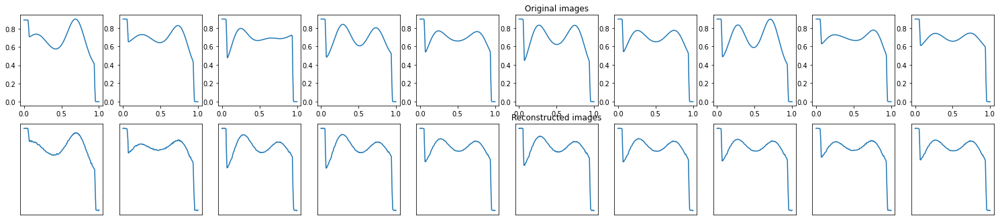

EPOCH 20/100 	 train loss 0.000784830714110285 	 val loss 0.0006772557971999049


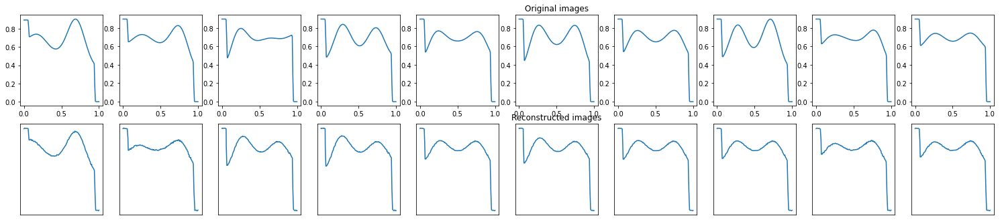

EPOCH 21/100 	 train loss 0.0007686039316467941 	 val loss 0.0006693603936582804


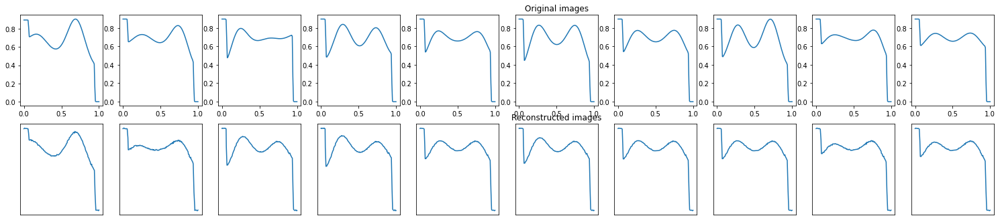

EPOCH 22/100 	 train loss 0.000756806053686887 	 val loss 0.000658092147205025


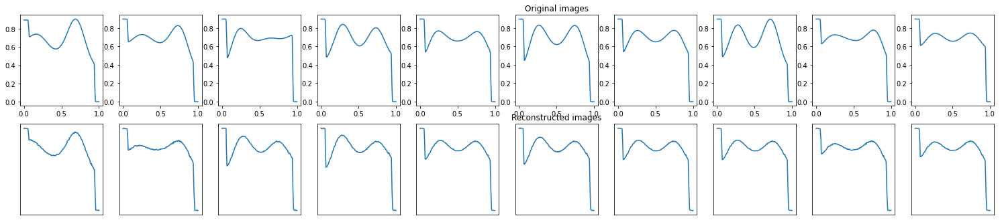

EPOCH 23/100 	 train loss 0.0007492387085221708 	 val loss 0.000649655528832227


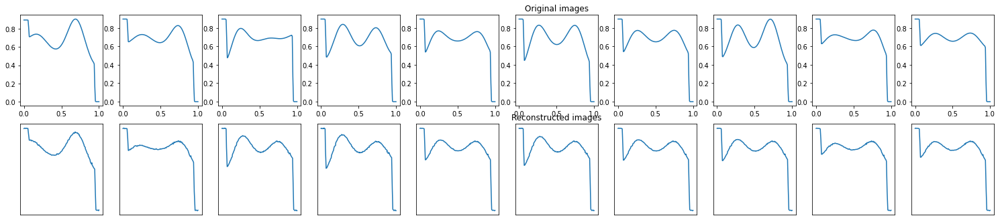

EPOCH 24/100 	 train loss 0.0007428055978380144 	 val loss 0.0006324031273834407


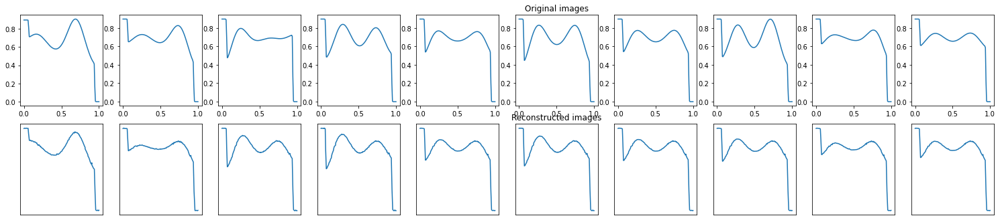

EPOCH 25/100 	 train loss 0.0007403037743642926 	 val loss 0.0006187433609738946


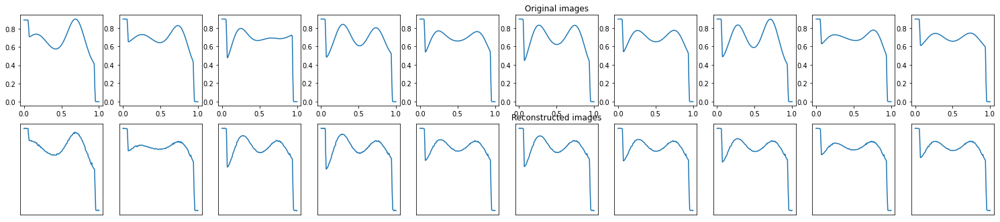

EPOCH 26/100 	 train loss 0.0007380020688287914 	 val loss 0.0006873905076645315


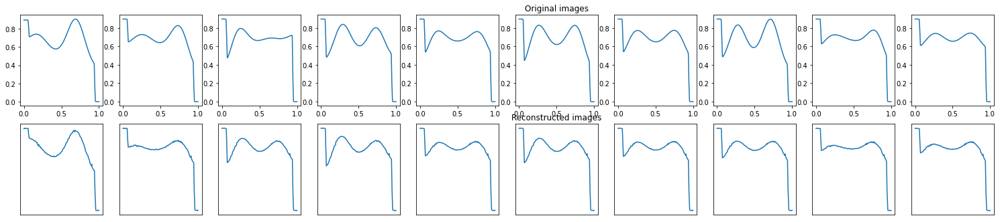

EPOCH 27/100 	 train loss 0.0008091344498097897 	 val loss 0.0006251716986298561


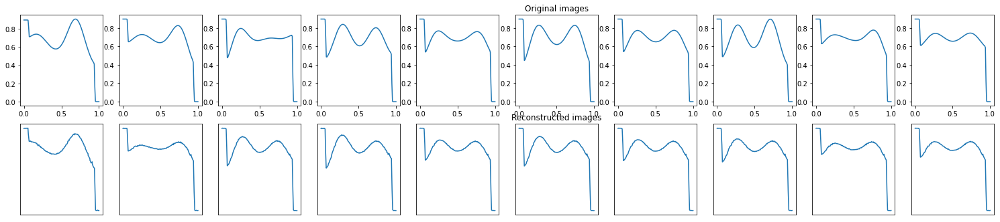

EPOCH 28/100 	 train loss 0.0007805373170413077 	 val loss 0.0006064840126782656


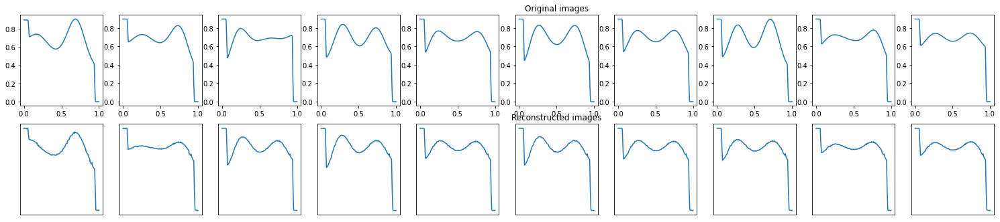

EPOCH 29/100 	 train loss 0.0007295376271940768 	 val loss 0.0006046665366739035


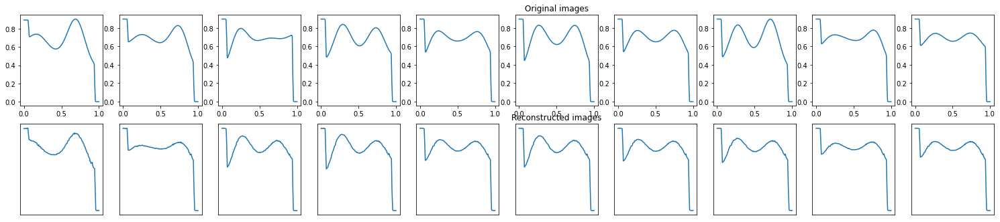

EPOCH 30/100 	 train loss 0.000728901824913919 	 val loss 0.0006061179446987808


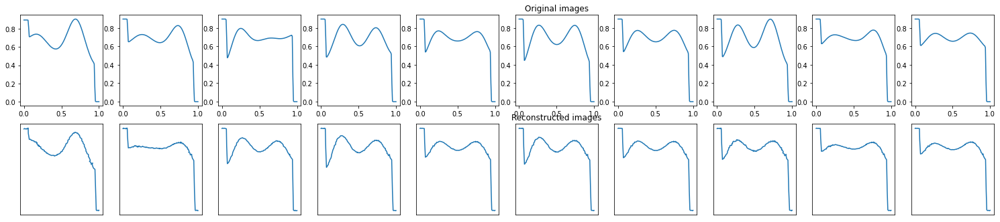

EPOCH 31/100 	 train loss 0.0006699728546664119 	 val loss 0.0005329323466867208


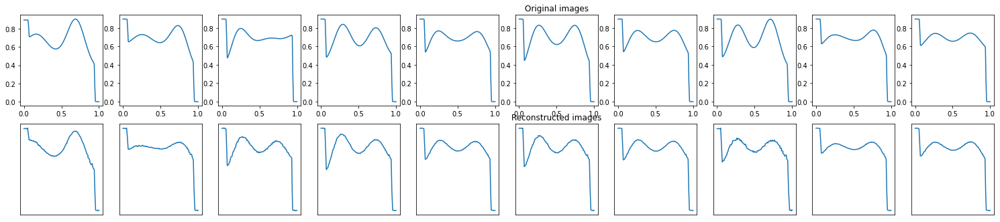

EPOCH 32/100 	 train loss 0.0005840131198056042 	 val loss 0.0003755621437449008


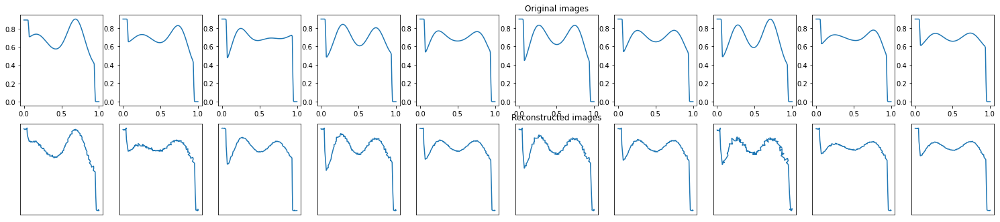

EPOCH 33/100 	 train loss 0.00044233538210392 	 val loss 0.00030072295339778066


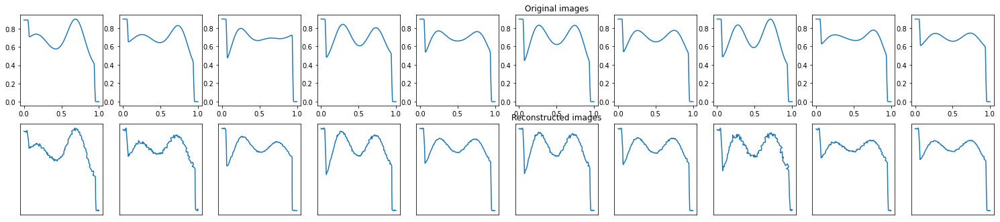

EPOCH 34/100 	 train loss 0.00033826177241280675 	 val loss 0.00026126016746275127


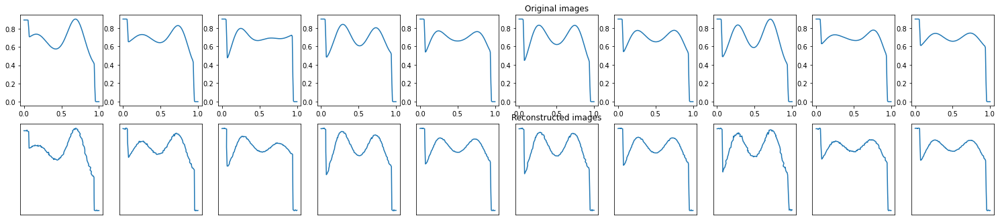

EPOCH 35/100 	 train loss 0.0002519577683415264 	 val loss 0.00012666235852520913


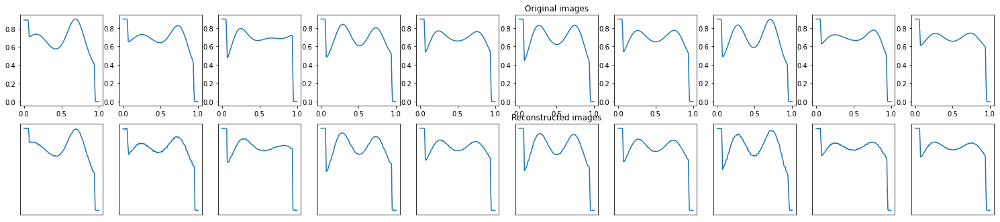

EPOCH 36/100 	 train loss 0.00018197200552094728 	 val loss 0.00010528667189646512


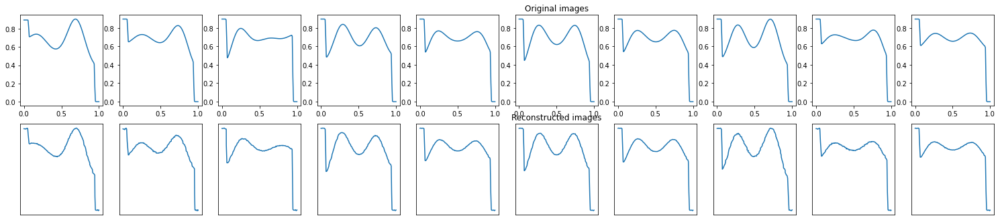

EPOCH 37/100 	 train loss 0.00018254228052683175 	 val loss 0.00011119709961349145


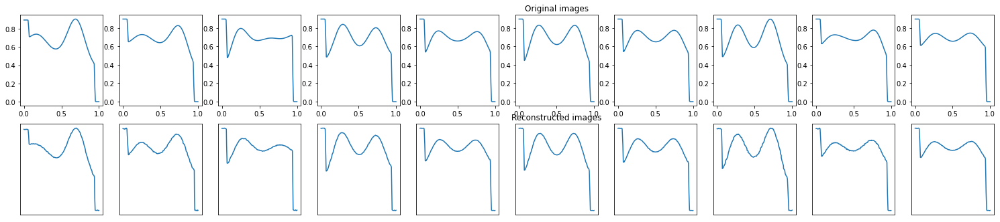

EPOCH 38/100 	 train loss 0.00016843080811668187 	 val loss 8.991248614620417e-05


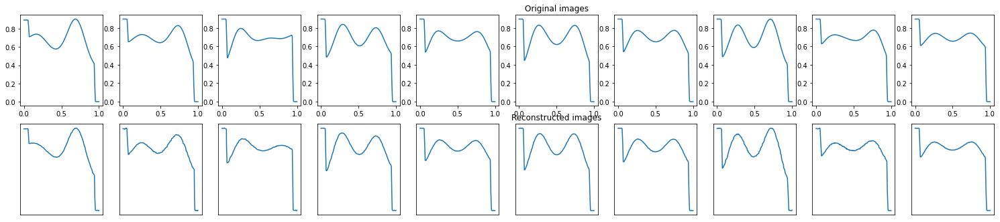

EPOCH 39/100 	 train loss 0.00015640360652469099 	 val loss 8.703577623236924e-05


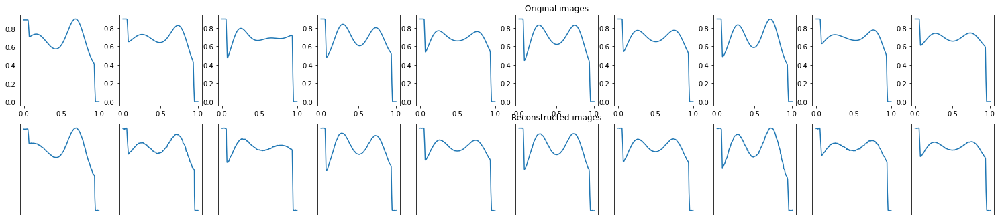

EPOCH 40/100 	 train loss 0.00015539352898485959 	 val loss 9.2340174887795e-05


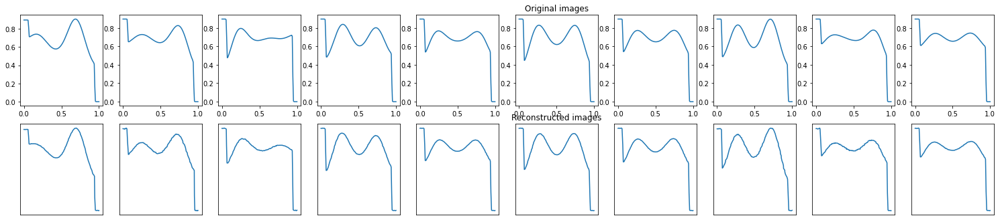

EPOCH 41/100 	 train loss 0.00014947693853173405 	 val loss 8.30329445307143e-05


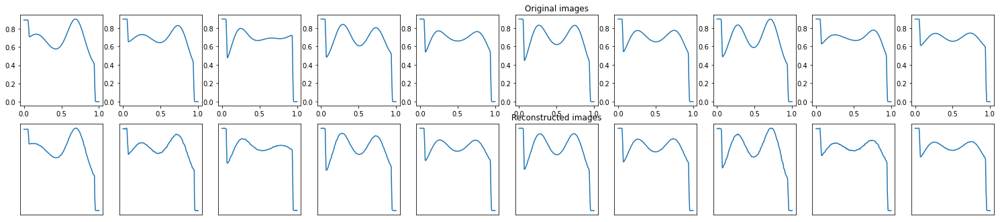

EPOCH 42/100 	 train loss 0.0001420372718712315 	 val loss 8.079884719336405e-05


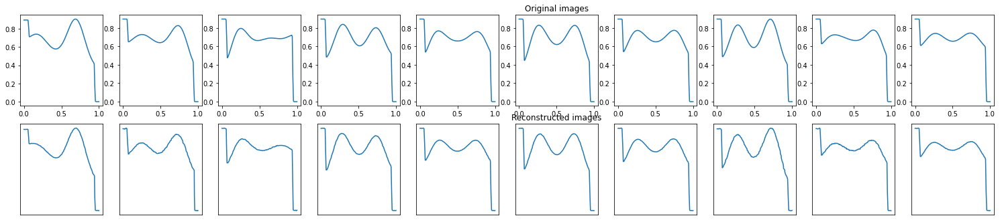

EPOCH 43/100 	 train loss 0.00013879701145924628 	 val loss 8.293052815133706e-05


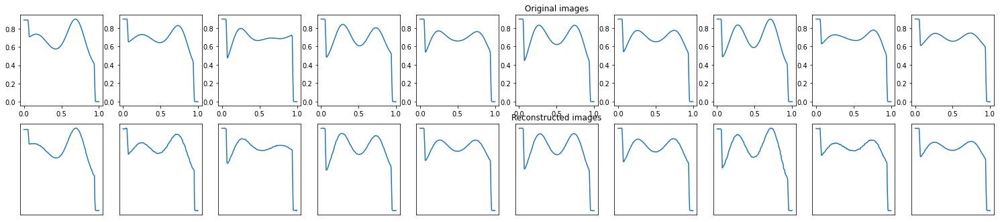

EPOCH 44/100 	 train loss 0.0001373197592329234 	 val loss 8.399104262934998e-05


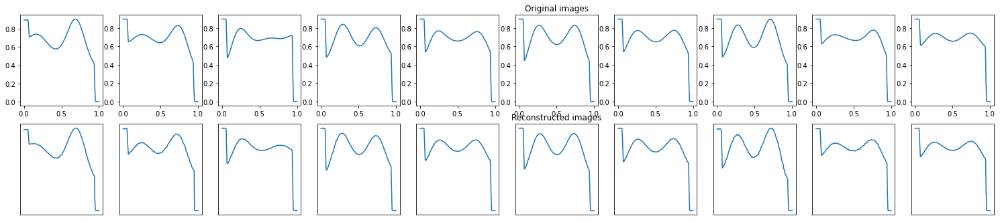

EPOCH 45/100 	 train loss 0.0001332790416199714 	 val loss 7.845486106816679e-05


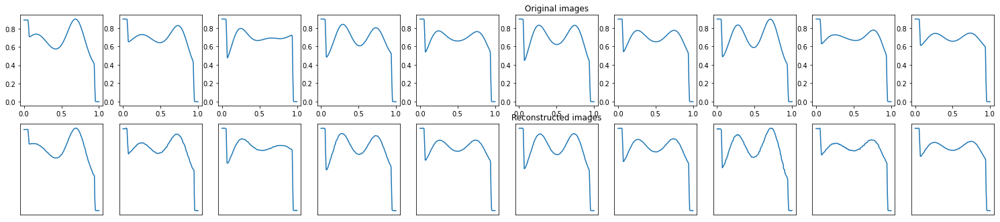

EPOCH 46/100 	 train loss 0.00013161601964384317 	 val loss 8.41740402393043e-05


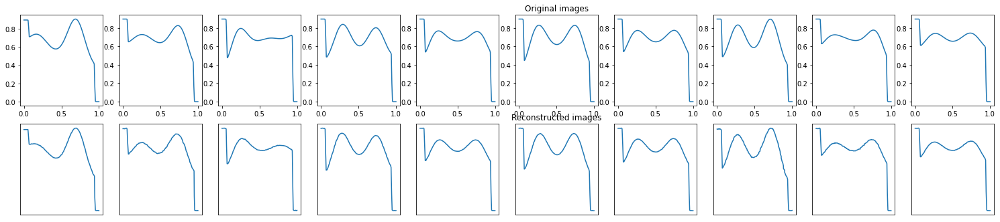

EPOCH 47/100 	 train loss 0.0001275761896977201 	 val loss 7.844098581699654e-05


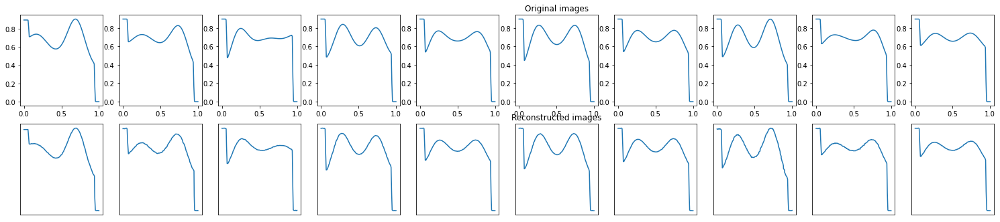

EPOCH 48/100 	 train loss 0.00012069225340383127 	 val loss 7.491572614526376e-05


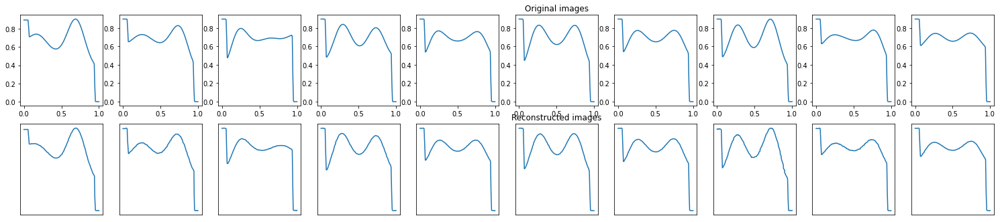

EPOCH 49/100 	 train loss 0.00011722265480784699 	 val loss 7.63470379752107e-05


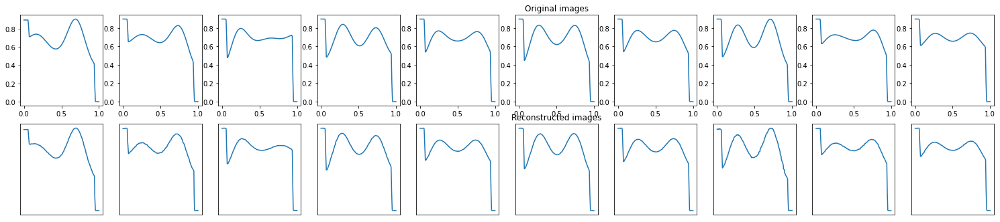

EPOCH 50/100 	 train loss 0.0001156642465502955 	 val loss 8.131056529236957e-05


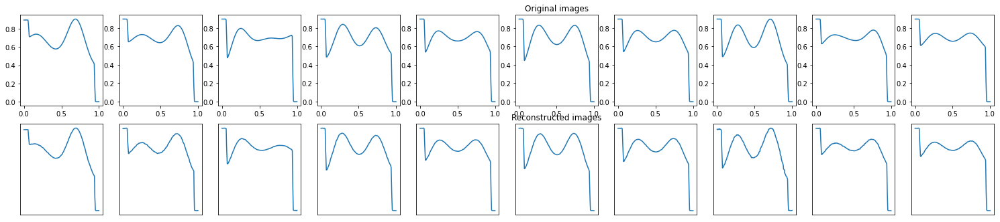

EPOCH 51/100 	 train loss 0.00011202554742339998 	 val loss 7.975059997988865e-05


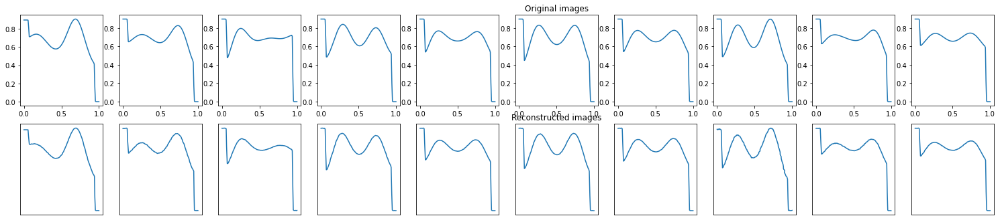

EPOCH 52/100 	 train loss 0.00010420506441732869 	 val loss 7.513901800848544e-05


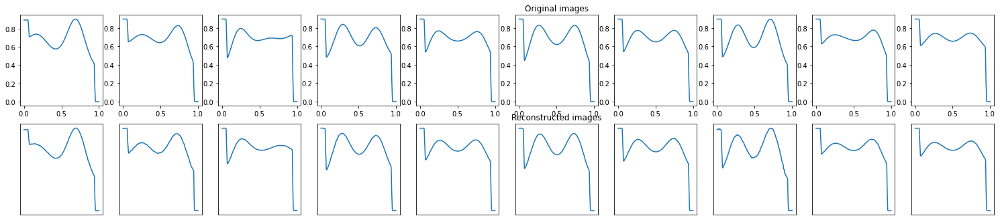

EPOCH 53/100 	 train loss 9.909662912832573e-05 	 val loss 7.915870810393244e-05


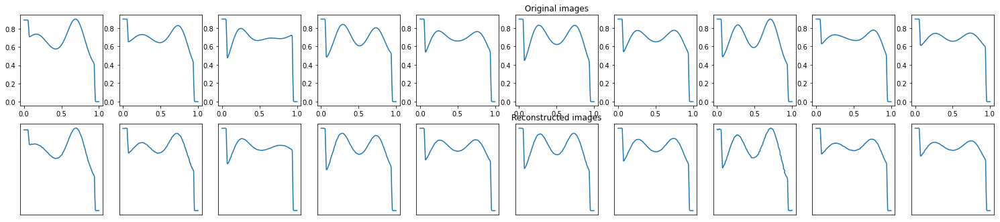

EPOCH 54/100 	 train loss 9.720697562443092e-05 	 val loss 8.880281529854983e-05


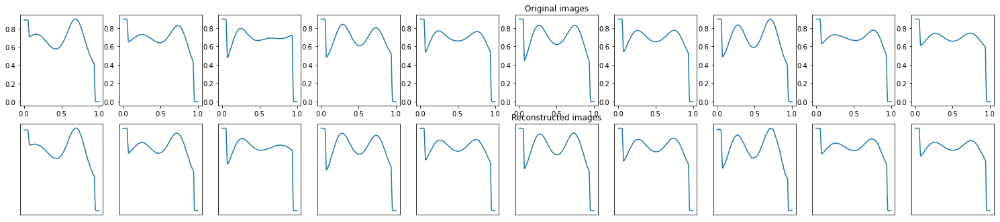

EPOCH 55/100 	 train loss 9.761624824022874e-05 	 val loss 7.166583236539736e-05


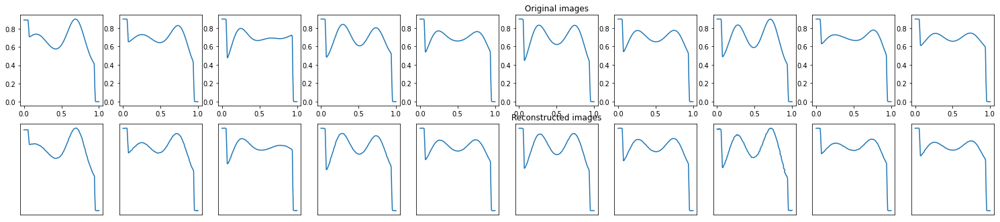

EPOCH 56/100 	 train loss 8.33681333460845e-05 	 val loss 5.777459955425002e-05


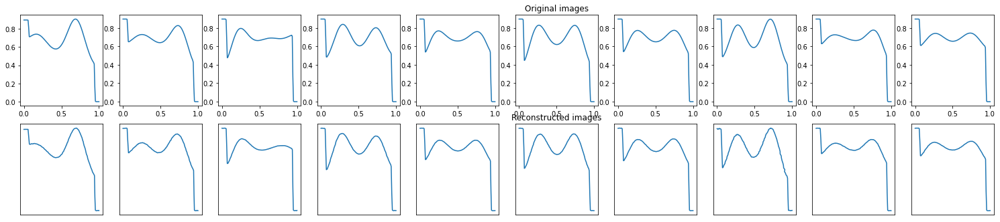

EPOCH 57/100 	 train loss 7.939057832118124e-05 	 val loss 7.939918577903882e-05


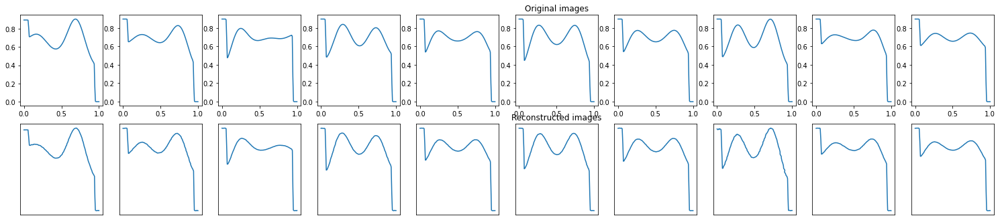

EPOCH 58/100 	 train loss 8.077560050878674e-05 	 val loss 6.546563236042857e-05


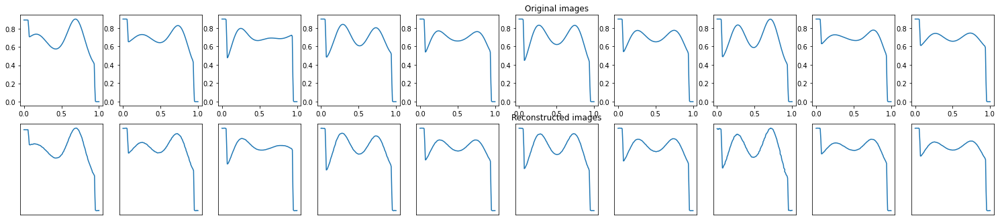

EPOCH 59/100 	 train loss 7.524647662648931e-05 	 val loss 7.09072410245426e-05


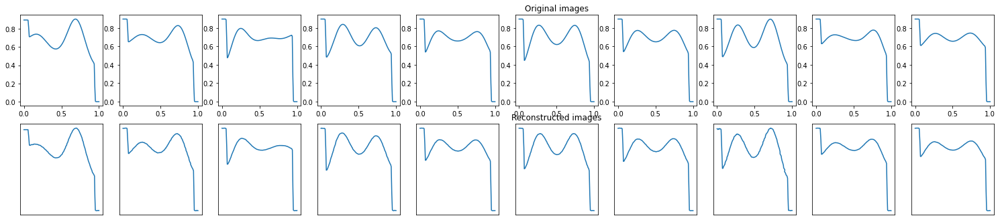

EPOCH 60/100 	 train loss 7.282112346729264e-05 	 val loss 6.954239506740123e-05


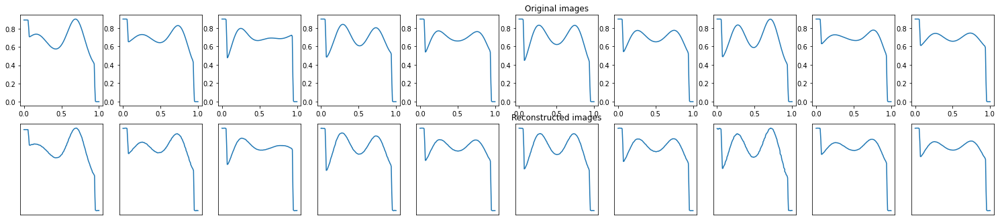

EPOCH 61/100 	 train loss 6.768187449779361e-05 	 val loss 6.742878031218424e-05


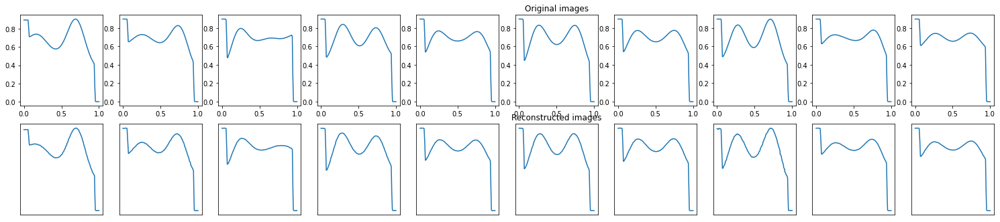

EPOCH 62/100 	 train loss 6.475806731032208e-05 	 val loss 7.053324225125834e-05


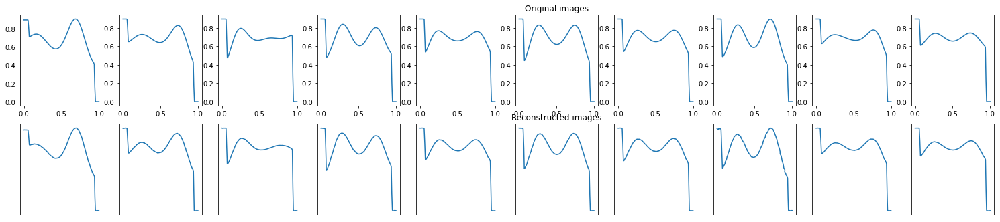

EPOCH 63/100 	 train loss 6.557365850312635e-05 	 val loss 7.224211003631353e-05


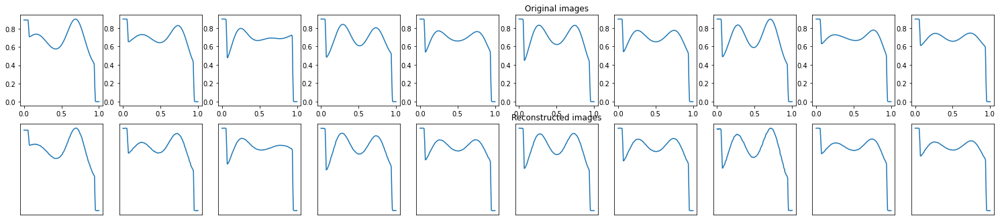

EPOCH 64/100 	 train loss 6.069303708500229e-05 	 val loss 5.617022543447092e-05


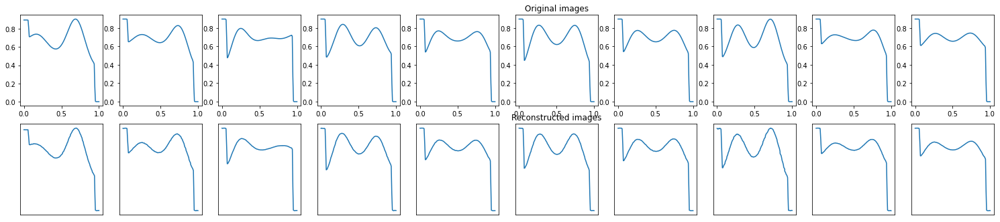

EPOCH 65/100 	 train loss 5.794290700578131e-05 	 val loss 6.793766806367785e-05


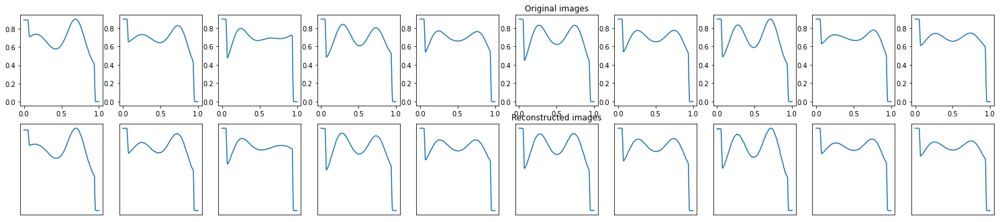

EPOCH 66/100 	 train loss 6.041065353201702e-05 	 val loss 7.63427815400064e-05


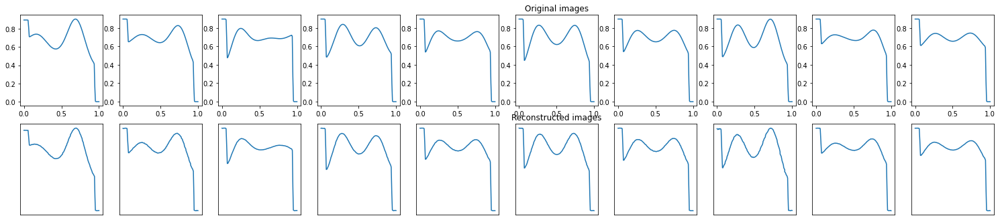

EPOCH 67/100 	 train loss 6.260527152335271e-05 	 val loss 7.177161023719236e-05


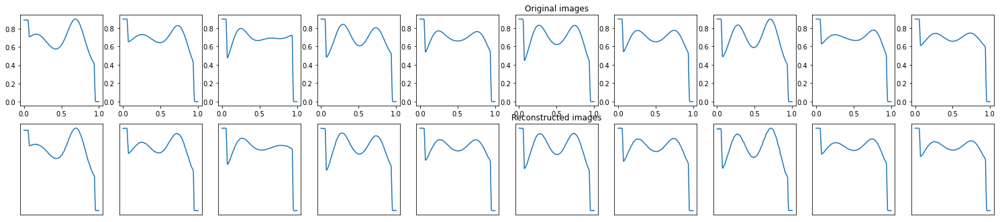

EPOCH 68/100 	 train loss 6.005214891047217e-05 	 val loss 5.536947719519958e-05


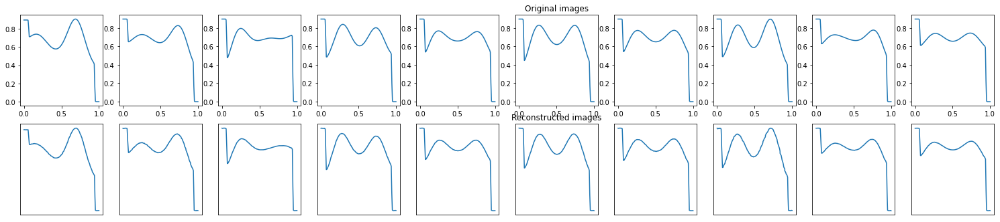

EPOCH 69/100 	 train loss 5.175486876396462e-05 	 val loss 5.6766664783935994e-05


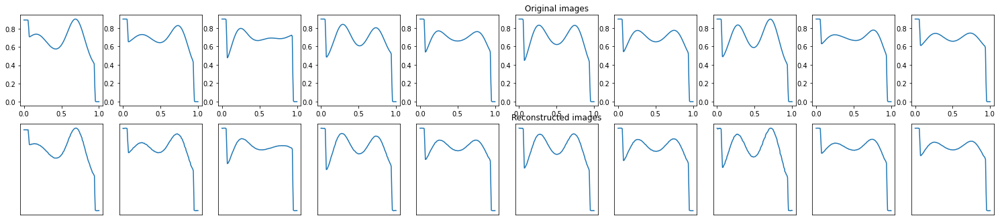

EPOCH 70/100 	 train loss 5.4442039981950074e-05 	 val loss 6.87401625327766e-05


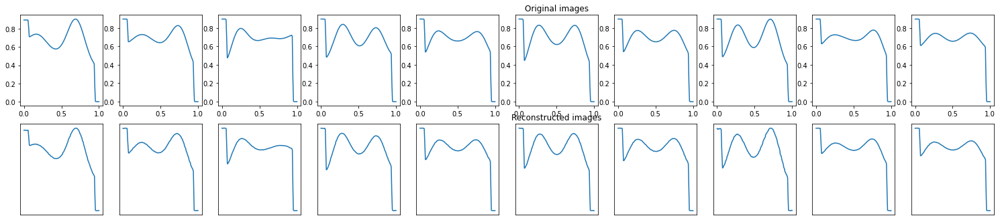

EPOCH 71/100 	 train loss 5.698204768123105e-05 	 val loss 6.70191875542514e-05


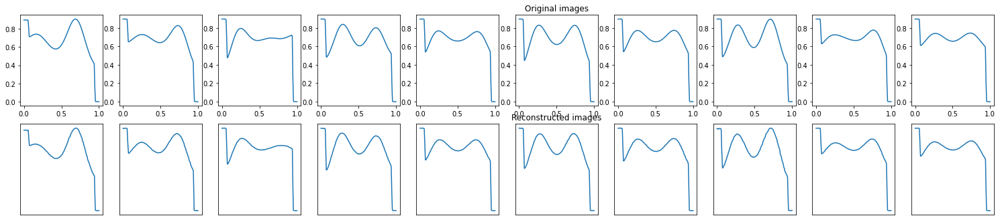

EPOCH 72/100 	 train loss 5.547024920815602e-05 	 val loss 6.376462988555431e-05


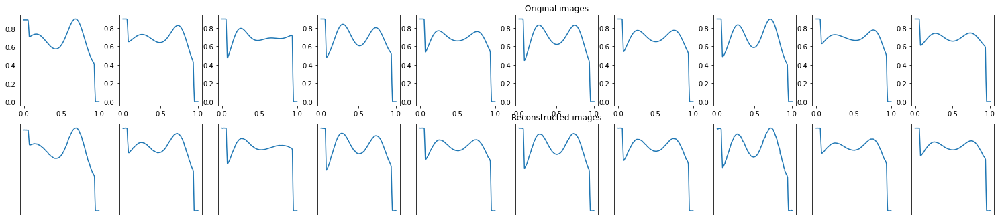

EPOCH 73/100 	 train loss 5.254874486126937e-05 	 val loss 5.7245819334639236e-05


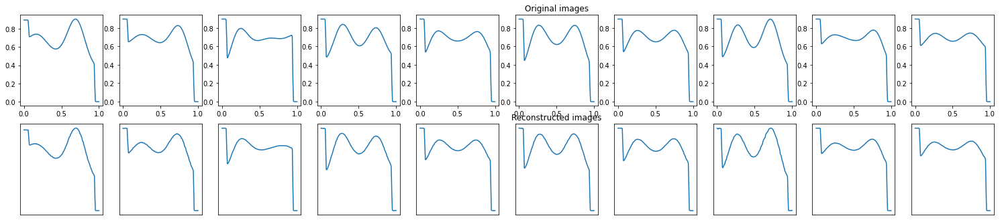

EPOCH 74/100 	 train loss 5.2155002776999027e-05 	 val loss 6.231924635358155e-05


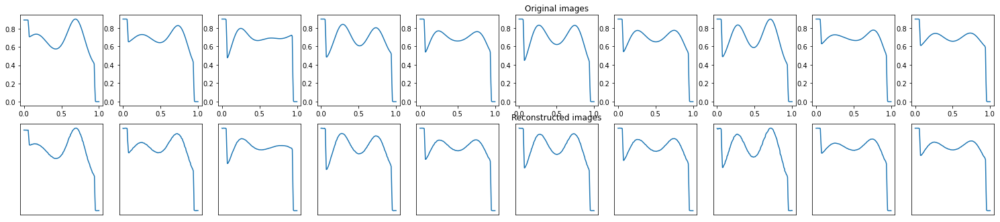

EPOCH 75/100 	 train loss 5.389498983277008e-05 	 val loss 5.993955710437149e-05


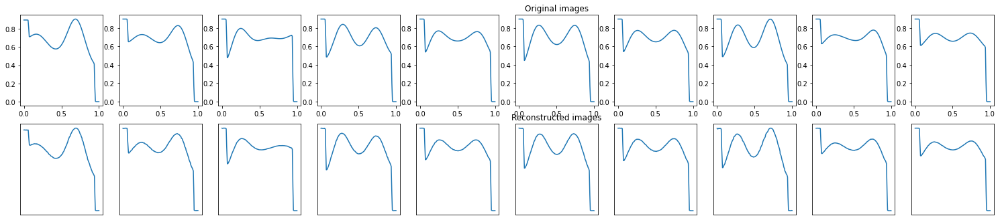

EPOCH 76/100 	 train loss 5.559963756240904e-05 	 val loss 5.9681377024389803e-05


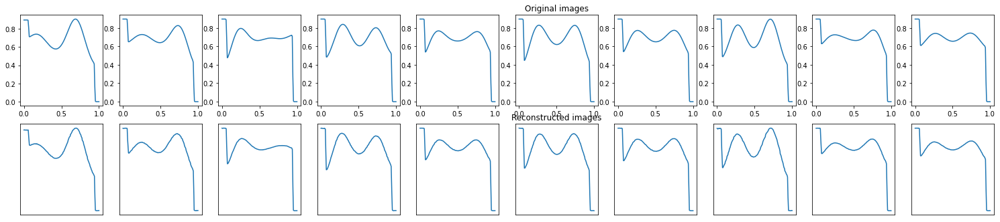

EPOCH 77/100 	 train loss 5.4483745770994574e-05 	 val loss 6.387976463884115e-05


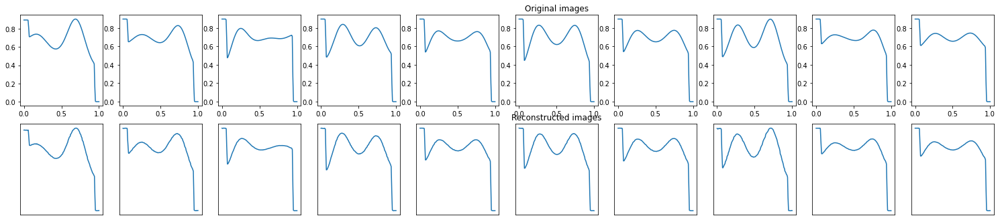

EPOCH 78/100 	 train loss 5.459618478198536e-05 	 val loss 6.668904097750783e-05


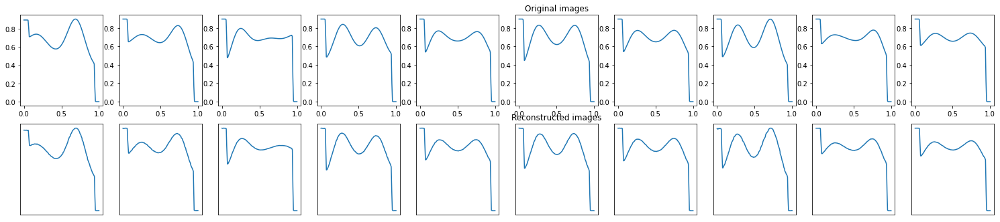

EPOCH 79/100 	 train loss 5.3012983698863536e-05 	 val loss 5.8913446991937235e-05


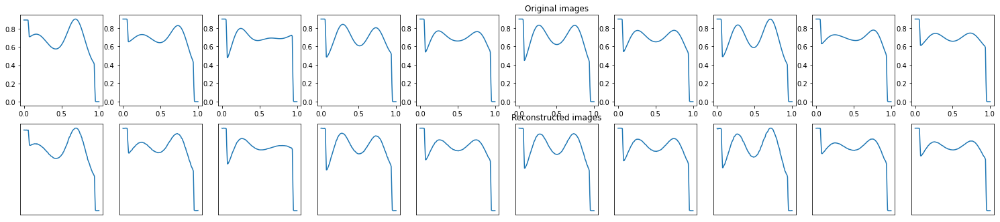

EPOCH 80/100 	 train loss 5.044788485975005e-05 	 val loss 5.737521860282868e-05


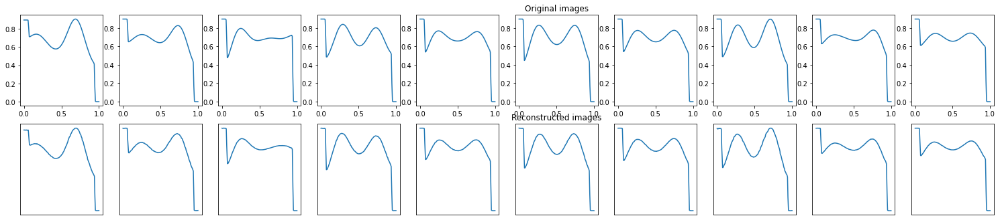

EPOCH 81/100 	 train loss 5.055426663602702e-05 	 val loss 5.338563641998917e-05


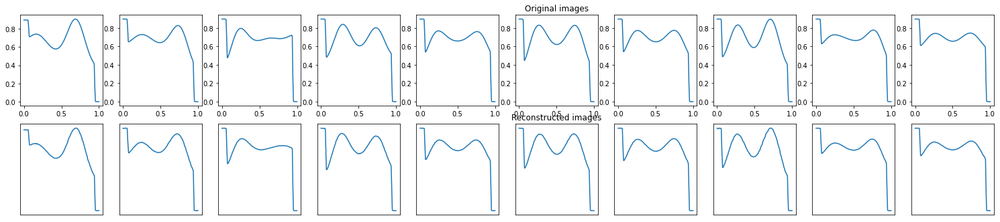

EPOCH 82/100 	 train loss 4.949160938849673e-05 	 val loss 5.258496821625158e-05


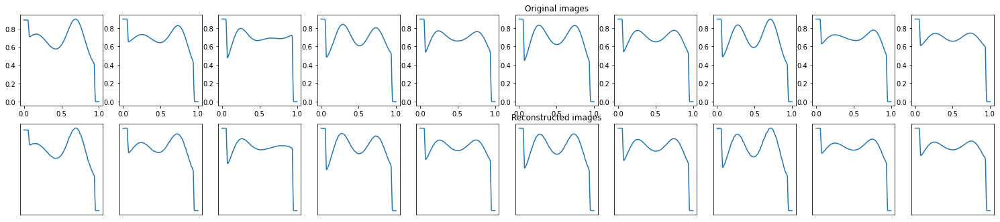

EPOCH 83/100 	 train loss 5.014865382690914e-05 	 val loss 5.188815703149885e-05


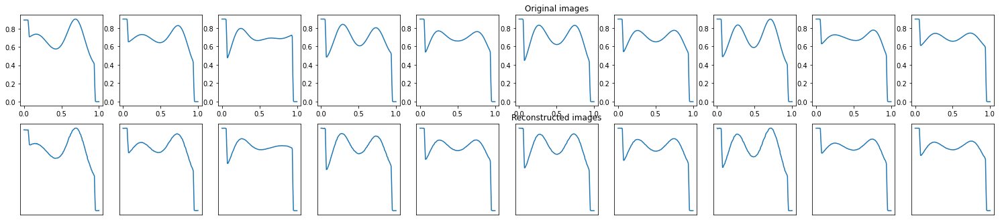

EPOCH 84/100 	 train loss 5.050676190876402e-05 	 val loss 5.09852179675363e-05


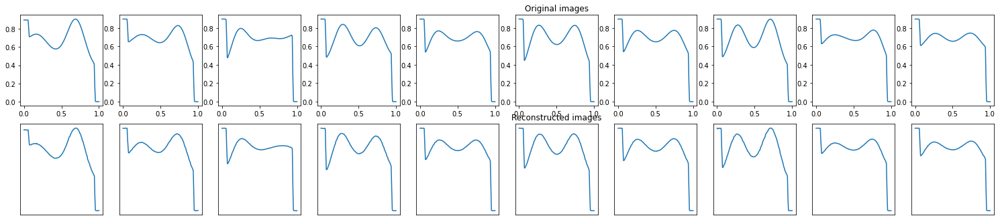

EPOCH 85/100 	 train loss 5.164396861800924e-05 	 val loss 5.60143162147142e-05


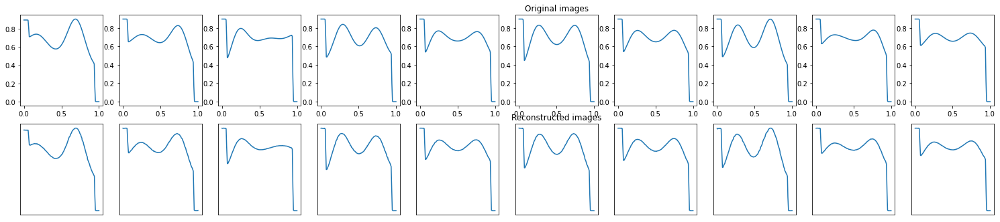

EPOCH 86/100 	 train loss 5.361107105272822e-05 	 val loss 5.570390203502029e-05


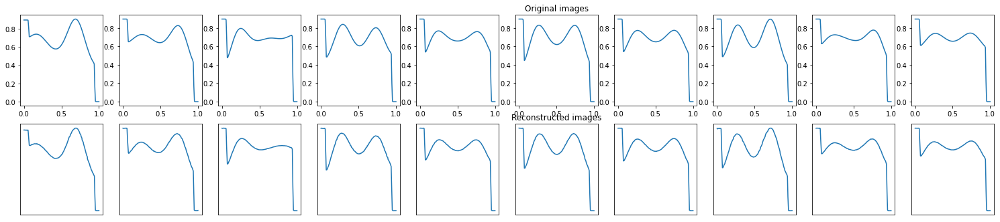

EPOCH 87/100 	 train loss 5.218642036197707e-05 	 val loss 5.9994814364472404e-05


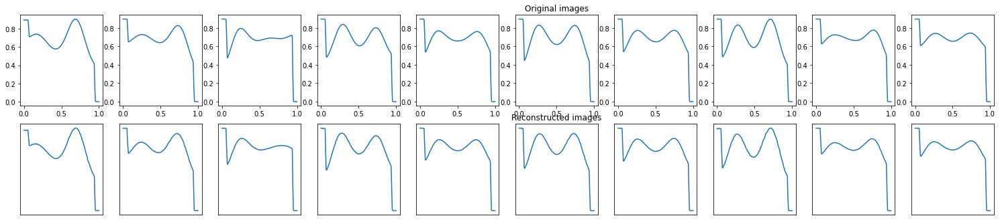

EPOCH 88/100 	 train loss 5.326577229425311e-05 	 val loss 6.199773633852601e-05


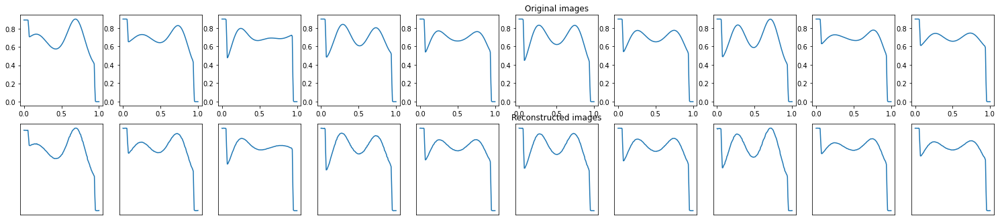

EPOCH 89/100 	 train loss 5.132377191330306e-05 	 val loss 5.4199463193072006e-05


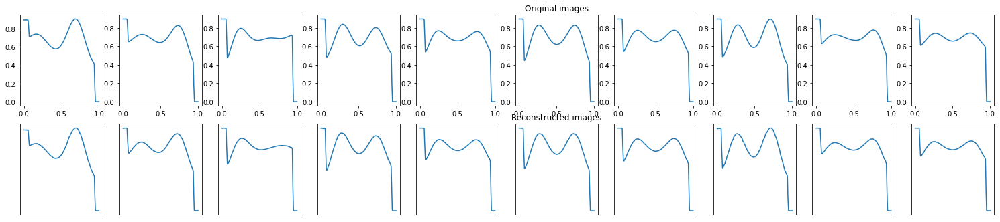

EPOCH 90/100 	 train loss 4.9495789426146075e-05 	 val loss 5.522122955881059e-05


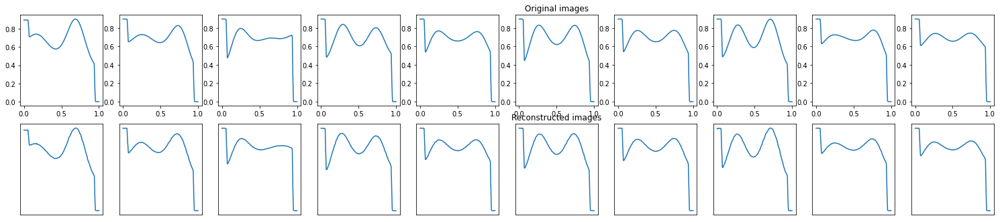

EPOCH 91/100 	 train loss 4.848271419177763e-05 	 val loss 4.887341128778644e-05


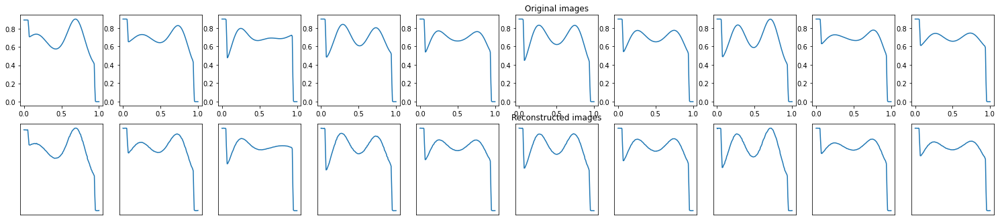

EPOCH 92/100 	 train loss 4.6936682338127866e-05 	 val loss 5.0620925321709365e-05


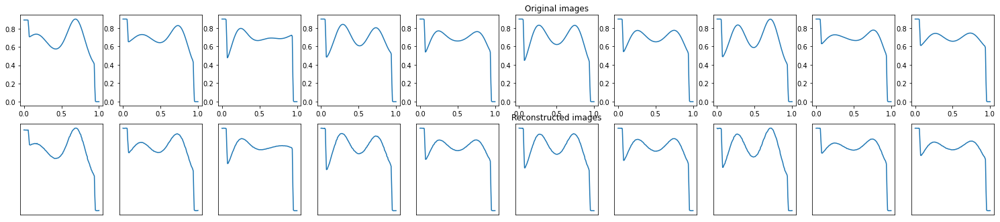

EPOCH 93/100 	 train loss 4.8375633923569694e-05 	 val loss 5.646305362461135e-05


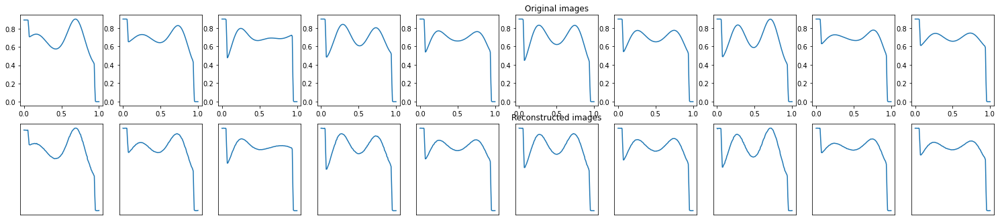

EPOCH 94/100 	 train loss 5.004287959309295e-05 	 val loss 4.6790792112005875e-05


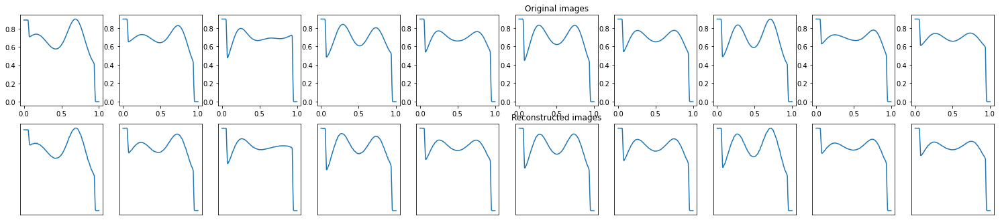

EPOCH 95/100 	 train loss 4.738817733596079e-05 	 val loss 4.6433895477093756e-05


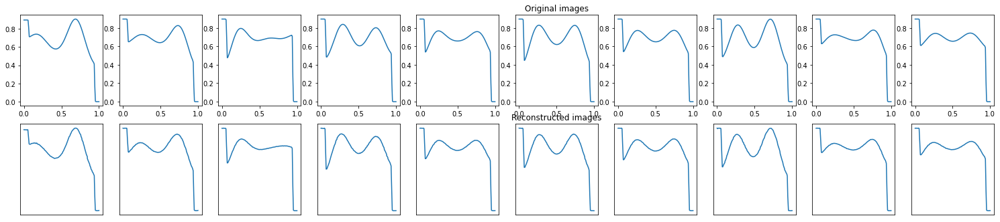

EPOCH 96/100 	 train loss 4.916582111036405e-05 	 val loss 5.0327926146565005e-05


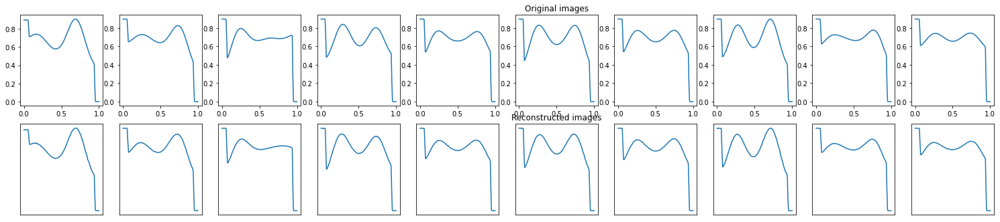

EPOCH 97/100 	 train loss 5.007334766560234e-05 	 val loss 4.445317608769983e-05


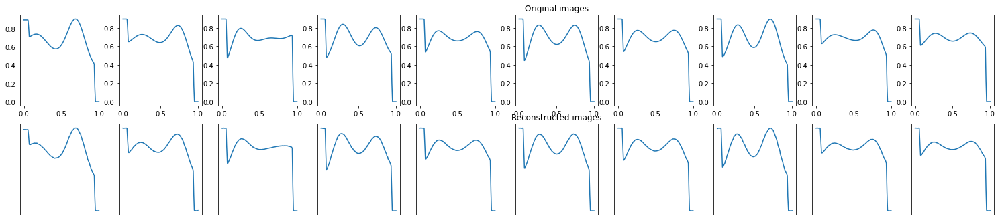

EPOCH 98/100 	 train loss 4.968386929249391e-05 	 val loss 4.4742879254044965e-05


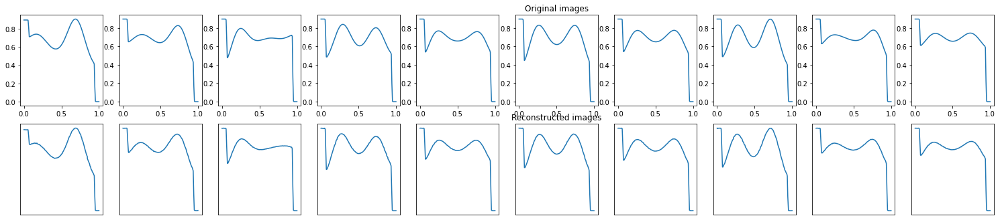

EPOCH 99/100 	 train loss 5.134221646585502e-05 	 val loss 4.744930993183516e-05


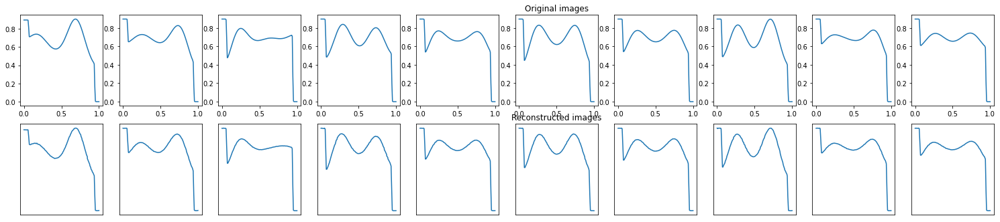

EPOCH 100/100 	 train loss 5.276540105114691e-05 	 val loss 4.8173911636695266e-05


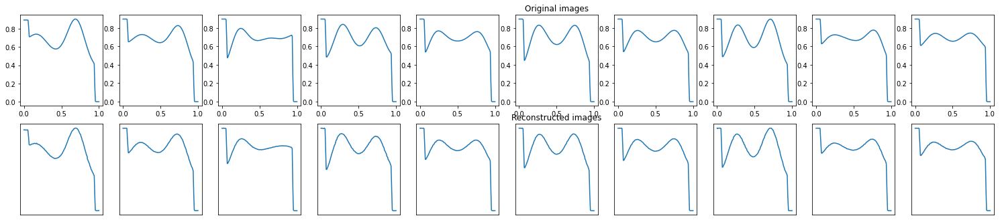

In [27]:
num_epochs = 100
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
  # print (epoch)
  train_loss = train_epoch(model,device,train_loader,loss_fn,optim)
  val_loss = test_epoch(model,device,valid_loader,loss_fn)
  print('EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
  diz_loss['train_loss'].append(train_loss)
  diz_loss['val_loss'].append(val_loss)
  plot_ae_outputs(model,xtrain_dataset,device,n=10)

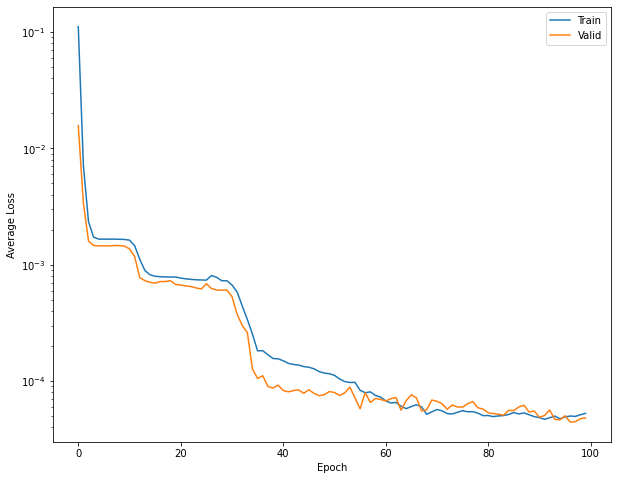

In [28]:
# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

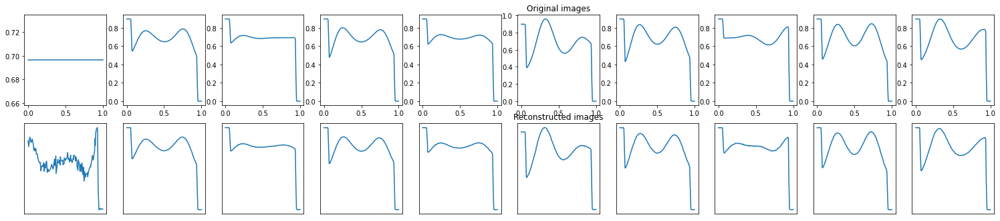

In [29]:
plot_ae_outputs(model,xtest_dataset,device,n=10)